In [1]:
import scanpy as sc
import scvi
from matplotlib import rcParams
import matplotlib.pyplot as plt
from liana.method import cellphonedb

folder_path = "C:/Users/heung/OneDrive/Documents/scData/16. Siglec-9_GSE235913/concat/"

In [2]:
adata = sc.read(folder_path + "adata_annotated.h5ad")

In [4]:
adata_myeloid = adata[adata.obs['cell_type'].isin(['Monocytic cells', 'Microglia'])]
adata_myeloid.write_h5ad(folder_path + "adata_myeloid.h5ad")

In [2]:
adata_myeloid = sc.read(folder_path + "adata_myeloid.h5ad")

# scVI re-clustering

In [3]:
# making the scVI model
# GPU 안쓰면 개느림. Cuda <- 필수

scvi.model.SCVI.setup_anndata(
    adata_myeloid,
    layer = 'counts',
    continuous_covariate_keys = ['pct_counts_mito', 'pct_counts_ribo', 'total_counts'],
    batch_key = 'sample'
)
model = scvi.model.SCVI(
    adata_myeloid,
    n_layers = 4,
    n_latent = 60,
    gene_likelihood = 'nb',
)

Unable to initialize backend 'cuda': 
Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'tpu': UNIMPLEMENTED: LoadPjrtPlugin is not implemented on windows yet.
c:\Users\heung\anaconda3\Lib\site-packages\scvi\data\fields\_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
c:\Users\heung\anaconda3\Lib\site-packages\scvi\data\fields\_dataframe_field.py:183: UserWarning: Category 67 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.


In [5]:
# model.train(max_epochs = 200)
model.train()   # 28m

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\heung\anaconda3\Lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:441: PossibleUserWarning: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 142/142: 100%|██████████| 142/142 [15:38<00:00,  6.57s/it, v_num=1, train_loss_step=5.13e+3, train_loss_epoch=4.93e+3]

`Trainer.fit` stopped: `max_epochs=142` reached.


Epoch 142/142: 100%|██████████| 142/142 [15:38<00:00,  6.61s/it, v_num=1, train_loss_step=5.13e+3, train_loss_epoch=4.93e+3]


In [7]:
# get the latent space
adata_myeloid.obsm['X_scVI'] = model.get_latent_representation()
# model.get_latent_representation().shape
# 7.3GB (크게 차이 없음)

# get scVI normalized data
adata_myeloid.layers['scvi_normalized'] = model.get_normalized_expression() # <- 용량 큼 (~30GB)

# running time: 5m 25s for 94 samples

# Clustering 결과 확인

In [10]:
# 기본적인 clustering
# sc.pp.pca(adata)
sc.pp.neighbors(adata_myeloid, use_rep = 'X_scVI')
sc.tl.umap(adata_myeloid)

# running time: 1m 51s
# running time: 2m 23s for 94 samples

In [13]:
sc.tl.leiden(adata_myeloid, resolution = 0.5)

C:\Users\heung\AppData\Local\Temp\ipykernel_31228\1902515885.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


In [25]:
# 가상으로 normal cell을 설정 (확실한 친구들만)
import numpy as np
adata_myeloid.obs['cell_type'] = 'Monocyte'

specific_gene = 'P2RY12'
threshold = 0

# 발현 행렬에서 특정 gene의 열 인덱스 찾기
gene_index = np.where(adata_myeloid.var_names == specific_gene)[0][0]

# 발현량이 threshold 이상인 cell_type을 microglia로 변경
for cell_index in range(len(adata_myeloid.obs_names)):
    if adata_myeloid.X[cell_index, gene_index] > threshold:
        adata_myeloid.obs['cell_type'][cell_index] = 'microglia'

... storing 'cell_type' as categorical


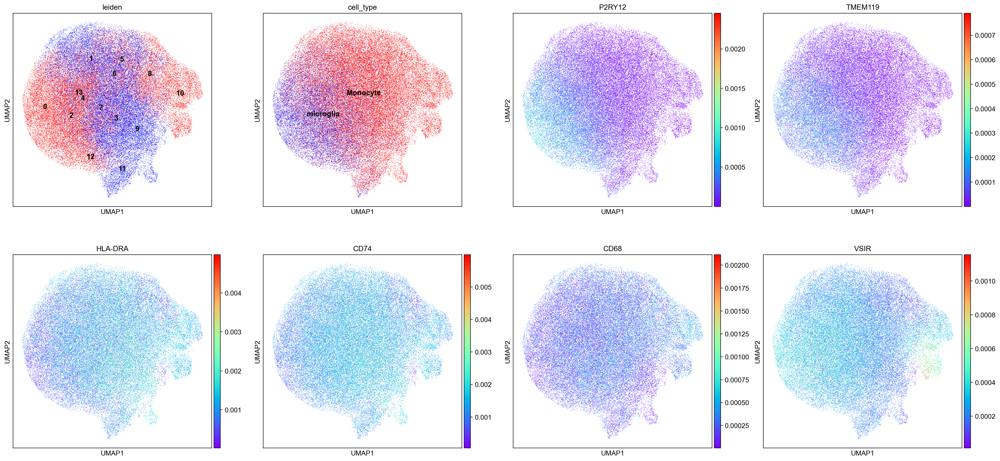

In [26]:
rcParams['figure.figsize'] = (6, 6)

sc.pl.umap(
    adata_myeloid,
    color = ['leiden', 'cell_type', 'P2RY12', 'TMEM119', 'HLA-DRA', 'CD74', 'CD68', 'VSIR'],
    layer = 'scvi_normalized',
    color_map = 'rainbow',
    legend_loc = 'on data',
    palette = ['red', 'blue']
)

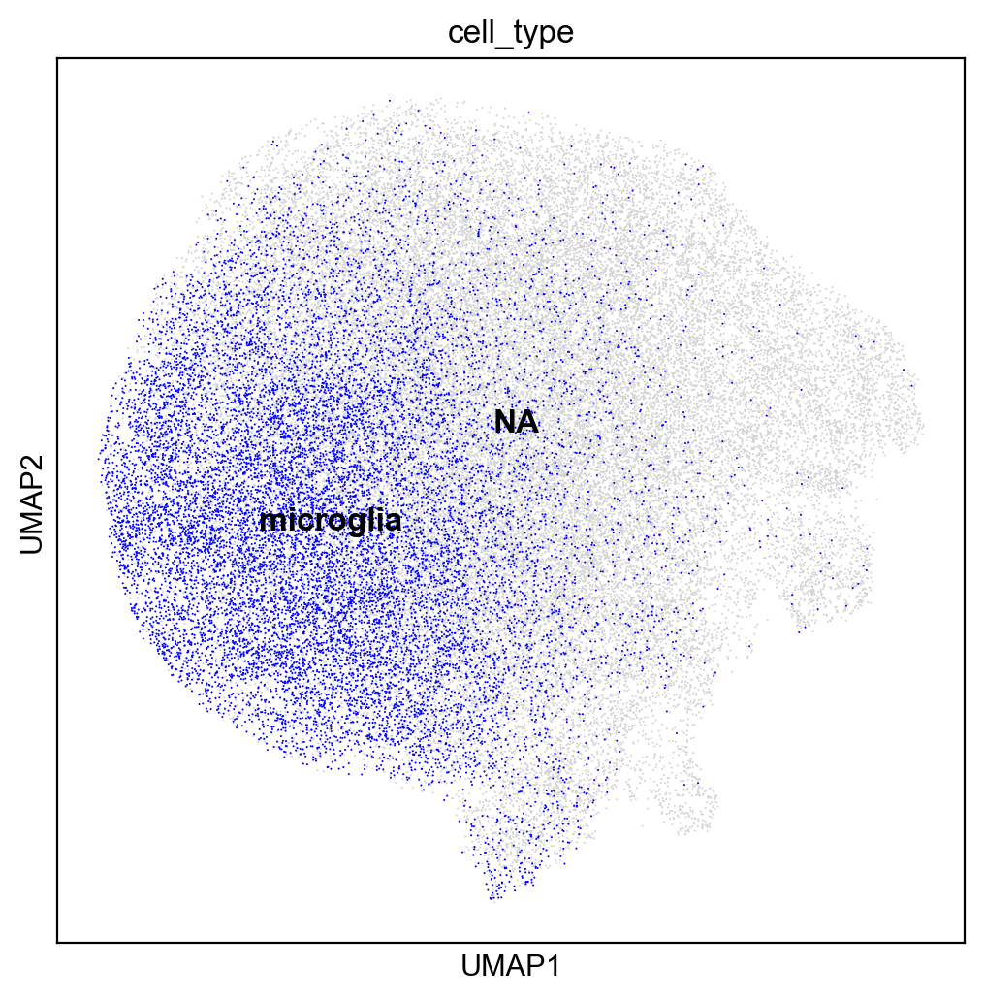

In [30]:
rcParams['figure.figsize'] = (6, 6)

sc.pl.umap(
    adata_myeloid,
    color = ['cell_type',],
    layer = 'scvi_normalized',
    legend_loc = 'on data',
    groups = ['microglia']
    # groups = ['Monocyte']
)

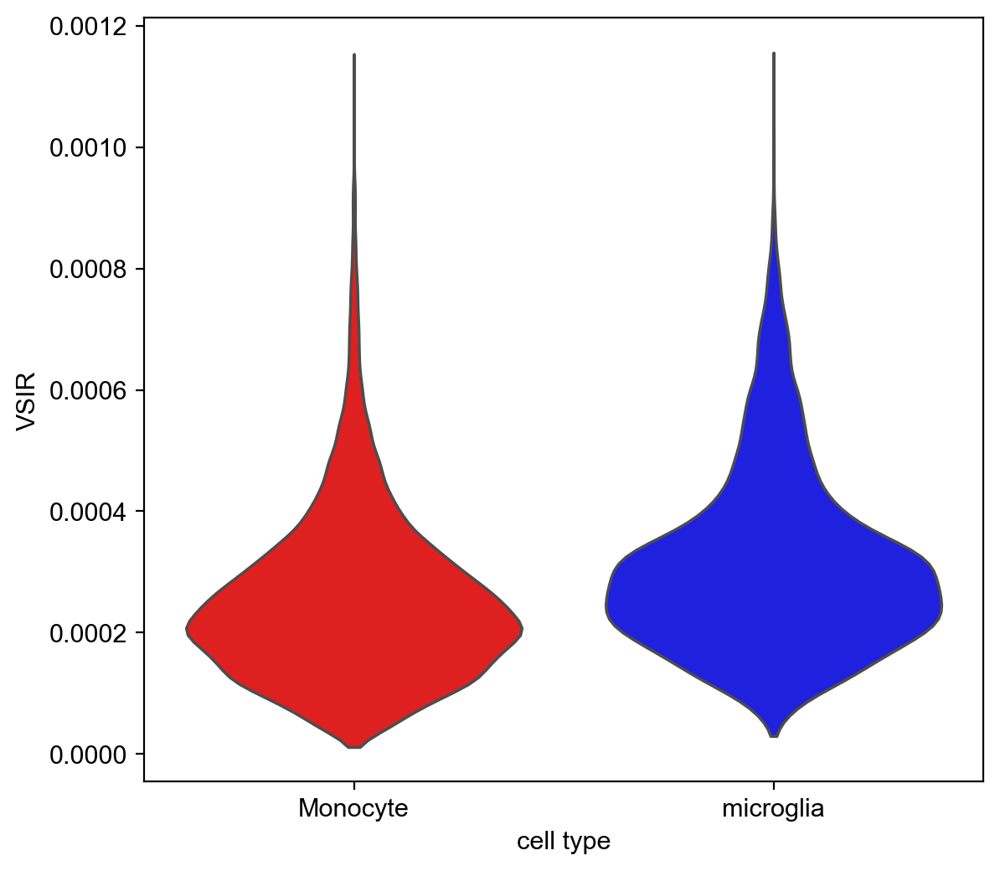

In [39]:
# plot violin plot by cnv_score
# fig, ax = plt.subplots(figsize = (16, 4))

sc.pl.violin(
    adata_myeloid,
    keys = ['VSIR'],
    groupby = 'cell_type',
    stripplot = False,
    # jitter = 0.4,
    # size = 0.3,
    layer = 'scvi_normalized', use_raw = False,
    # ax = ax,
)

In [40]:
adata_myeloid.write_h5ad(folder_path + "adata_myeloid.h5ad")
model.save(folder_path + 'model_myeloid/')  # trained model 저장

NameError: name 'model' is not defined